In [1]:
from pathlib import Path
from tqdm.auto import tqdm
import joblib
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import precision_score, recall_score, f1_score, accuracy_score
import numpy as np
import matplotlib.pyplot as plt
from IPython.display import display, HTML
from typing import Tuple, List
from itertools import product
from sklearn.linear_model import LinearRegression
from sklearn.preprocessing import StandardScaler
import skimage.measure
from sklearn.pipeline import Pipeline
from parallel_map import parallel_map
from math import atan2, sqrt
import pandas as pd


EMBEDDINGS_BASE_PATH = Path("embeddings")


plt.rcParams["figure.figsize"] = (30, 15)
plt.rcParams["figure.facecolor"] = "white"
plt.rcParams["font.size"] = 12
plt.rcParams["axes.xmargin"] = 0

In [2]:
def load_embeddings(
    text_path: Path, image_path: Path, text_feature_name: str, image_feature_name: str
) -> Tuple[List[List[float]], List[Tuple[List[float], str]]]:
    X, y = [], []
    texts = list(joblib.load(text_path).items())
    for p1, image in tqdm(list(joblib.load(image_path).items())):
        for p2, image_captions in texts:
            for text in image_captions.values():
                if p1 == p2:
                    X.append(text[text_feature_name])
                    y.append((image[image_feature_name], text["class_name"]))
    return X, y

In [3]:
def show_connections(matrix, count):
    matrix = skimage.measure.block_reduce(matrix, (count, count), np.max)
    selected = list(range(count))

    width = 1500
    height = 800
    size = 15

    def draw_node(i, id, is_left):
        alignment = "left: 0;" if is_left else "right: 0;"

        return f"""
            <div style='position: absolute; {alignment} top: {(0.5 + i)/count * 100}%; transform: translateY(-50%); width: {size}px; height: {size}px; background: #e5d8bd; border: 1px solid black; border-radius: 1000px;'></div>
        """

    def draw_connection(i, j, index):
        delta_y = (j - i) / count
        angle = atan2(delta_y * height, width - size)
        len = sqrt((delta_y * height) ** 2 + (width - size) ** 2)
        scaled_weight = (20 / (index + 2)) / 2
        return f"""
            <div style='position: absolute; left: {size/2}px; top: {(0.5 + i)/count * 100}%; transform: rotate({angle}rad) translateY(-50%); border-radius: 10px; width: {len}px; height: {scaled_weight}px; background: #b3cde3; transform-origin: center left'></div>
        """

    edges = [
        ((i, i_id), (j, j_id))
        for (i, i_id), (j, j_id) in product(enumerate(selected), enumerate(selected))
    ]
    edges = sorted(edges, key=lambda v: matrix[v[0][1]][v[1][1]], reverse=True)[:40]
    return HTML(
        f"""
        <div style='width: {width*1.1}px; height: {height*1.1}px; background: white; display: flex; align-items: center; justify-content: center;'>
            <div style='width: {width}px; height: {height}px; position: relative'>
                {' '.join(draw_connection(i, j, index) for index, ((i, i_id), (j, j_id)) in enumerate(edges, start=1))}
                {' '.join(draw_node(i, id, is_left=True) for i, id in enumerate(selected))}
                {' '.join(draw_node(i, id, is_left=False) for i, id in enumerate(selected))}
            </div>
        </div>
        """
    )

In [4]:
coefs = {}
classification_metrics = {}


def evaluate_matching(
    text_feature_name: str, image_feature_name: str, dataset_name: str
):
    name = (
        f"{text_feature_name.upper()} - {image_feature_name.upper()} ({dataset_name})"
    )
    X_train, y_train = load_embeddings(
        EMBEDDINGS_BASE_PATH / f"text_embeddings_train_{dataset_name}.p",
        EMBEDDINGS_BASE_PATH / f"image_embeddings_train_{dataset_name}.p",
        text_feature_name,
        image_feature_name,
    )

    regressor = Pipeline(
        [("scaler", StandardScaler()), ("regressor", LinearRegression())]
    )
    regressor.fit(X_train, [y[0] for y in y_train])

    coefs[name] = regressor.named_steps["regressor"].coef_.transpose()

    X_test, y_test = load_embeddings(
        EMBEDDINGS_BASE_PATH / f"text_embeddings_test_{dataset_name}.p",
        EMBEDDINGS_BASE_PATH / f"image_embeddings_test_{dataset_name}.p",
        text_feature_name,
        image_feature_name,
    )

    kn = KNeighborsClassifier(n_neighbors=1, algorithm="brute")
    y_test_unique = []
    for y in y_test:
        if not y_test_unique or not np.array_equal(y_test_unique[-1][0], y[0]):
            y_test_unique.append(y)
    kn.fit([y[0] for y in y_test_unique], [y[1] for y in y_test_unique])

    actual_classes = [y[1] for y in y_test]

    predicted_embeddings = parallel_map(lambda v: regressor.predict([v])[0], X_test)
    predicted_classes = parallel_map(lambda v: kn.predict([v])[0], predicted_embeddings)

    classification_metrics[name] = {
        "Top-1 Accuracy": accuracy_score(
            y_true=actual_classes, y_pred=predicted_classes
        ),
        "Precision": precision_score(
            y_true=actual_classes, y_pred=predicted_classes, average="macro"
        ),
        "Recall": recall_score(
            y_true=actual_classes, y_pred=predicted_classes, average="macro"
        ),
        "F1-score": f1_score(
            y_true=actual_classes, y_pred=predicted_classes, average="macro"
        ),
    }

    predicted_5_classes = parallel_map(
        lambda v: kn.kneighbors([v], 5, return_distance=False)[0], predicted_embeddings
    )

    best_classes = [
        actual
        if actual in [y_test_unique[i][1] for i in top_5]
        else y_test_unique[top_5[0]][1]
        for top_5, actual in zip(predicted_5_classes, actual_classes)
    ]

    classification_metrics[name]["Top-5 Accuracy"] = accuracy_score(
        y_true=actual_classes, y_pred=best_classes
    )

In [5]:
evaluate_matching("bert", "vgg", "flowers")
evaluate_matching("bert", "resnet", "flowers")
evaluate_matching("bert", "inception", "flowers")
evaluate_matching("tfidf", "vgg", "flowers")
evaluate_matching("tfidf", "resnet", "flowers")
evaluate_matching("tfidf", "inception", "flowers")

  0%|          | 0/6006 [00:00<?, ?it/s]

  0%|          | 0/2183 [00:00<?, ?it/s]

  0%|          | 0/9919 [00:00<?, ?it/s]

  0%|          | 0/9919 [00:00<?, ?it/s]

  0%|          | 0/9919 [00:00<?, ?it/s]

  0%|          | 0/6006 [00:00<?, ?it/s]

  0%|          | 0/2183 [00:00<?, ?it/s]

  0%|          | 0/9919 [00:00<?, ?it/s]

  0%|          | 0/9919 [00:00<?, ?it/s]

  0%|          | 0/9919 [00:00<?, ?it/s]

  0%|          | 0/6006 [00:00<?, ?it/s]

  0%|          | 0/2183 [00:00<?, ?it/s]

  0%|          | 0/9919 [00:00<?, ?it/s]

  0%|          | 0/9919 [00:00<?, ?it/s]

  0%|          | 0/9919 [00:00<?, ?it/s]

  0%|          | 0/6006 [00:00<?, ?it/s]

  0%|          | 0/2183 [00:00<?, ?it/s]

  0%|          | 0/9919 [00:00<?, ?it/s]

  0%|          | 0/9919 [00:00<?, ?it/s]

  0%|          | 0/9919 [00:00<?, ?it/s]

  0%|          | 0/6006 [00:00<?, ?it/s]

  0%|          | 0/2183 [00:00<?, ?it/s]

  0%|          | 0/9919 [00:00<?, ?it/s]

  0%|          | 0/9919 [00:00<?, ?it/s]

  0%|          | 0/9919 [00:00<?, ?it/s]

  0%|          | 0/6006 [00:00<?, ?it/s]

  0%|          | 0/2183 [00:00<?, ?it/s]

  0%|          | 0/9919 [00:00<?, ?it/s]

  0%|          | 0/9919 [00:00<?, ?it/s]

  0%|          | 0/9919 [00:00<?, ?it/s]

In [6]:
table = pd.DataFrame(classification_metrics).round(2).transpose()
print(table.style.to_latex())
display(table)

for k, coef in coefs.items():
    print(k)
    display(show_connections(coef, 20))

\begin{tabular}{lrrrrr}
 & Top-1 Accuracy & Precision & Recall & F1-score & Top-5 Accuracy \\
BERT - VGG (flowers) & 0.370000 & 0.300000 & 0.270000 & 0.230000 & 0.570000 \\
BERT - RESNET (flowers) & 0.360000 & 0.310000 & 0.260000 & 0.240000 & 0.530000 \\
BERT - INCEPTION (flowers) & 0.400000 & 0.290000 & 0.290000 & 0.270000 & 0.580000 \\
TFIDF - VGG (flowers) & 0.200000 & 0.280000 & 0.160000 & 0.130000 & 0.460000 \\
TFIDF - RESNET (flowers) & 0.180000 & 0.280000 & 0.130000 & 0.120000 & 0.330000 \\
TFIDF - INCEPTION (flowers) & 0.240000 & 0.240000 & 0.170000 & 0.150000 & 0.430000 \\
\end{tabular}



,Top-1 Accuracy,Precision,Recall,F1-score,Top-5 Accuracy
BERT - VGG (flowers),0.37,0.30,0.27,0.23,0.57
BERT - RESNET (flowers),0.36,0.31,0.26,0.24,0.53
BERT - INCEPTION (flowers),0.40,0.29,0.29,0.27,0.58
TFIDF - VGG (flowers),0.20,0.28,0.16,0.13,0.46
TFIDF - RESNET (flowers),0.18,0.28,0.13,0.12,0.33
TFIDF - INCEPTION (flowers),0.24,0.24,0.17,0.15,0.43


BERT - VGG (flowers)


BERT - RESNET (flowers)


BERT - INCEPTION (flowers)


TFIDF - VGG (flowers)


TFIDF - RESNET (flowers)


TFIDF - INCEPTION (flowers)


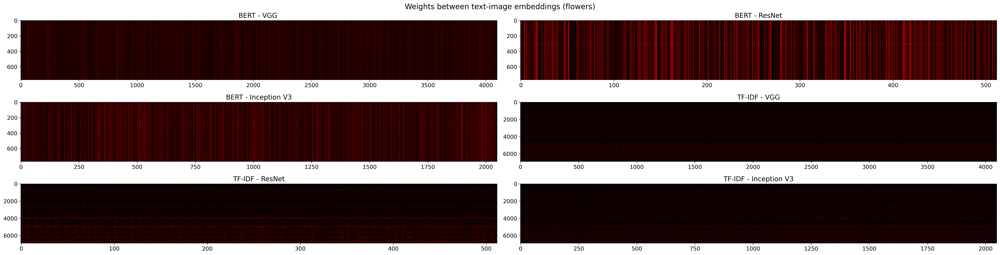

In [7]:
fig = plt.figure(dpi=300)
fig.suptitle("Weights between text-image embeddings (flowers)", fontsize=16)
ax = plt.subplot(6, 2, 1)
ax.set_title("BERT - VGG ")
plt.imshow(
    np.abs(coefs["BERT - VGG (flowers)"]),
    cmap="hot",
    interpolation="nearest",
    aspect="auto",
)
ax = plt.subplot(6, 2, 2)
ax.set_title("BERT - ResNet")
plt.imshow(
    np.abs(coefs.get("BERT - RESNET (flowers)")),
    cmap="hot",
    interpolation="nearest",
    aspect="auto",
)
ax = plt.subplot(6, 2, 3)
ax.set_title("BERT - Inception V3")
plt.imshow(
    np.abs(coefs.get("BERT - INCEPTION (flowers)")),
    cmap="hot",
    interpolation="nearest",
    aspect="auto",
)
ax = plt.subplot(6, 2, 4)
ax.set_title("TF-IDF - VGG")
plt.imshow(
    np.abs(coefs.get("TFIDF - VGG (flowers)")),
    cmap="hot",
    interpolation="nearest",
    aspect="auto",
)
ax = plt.subplot(6, 2, 5)
ax.set_title("TF-IDF - ResNet")
plt.imshow(
    np.abs(coefs.get("TFIDF - RESNET (flowers)")),
    cmap="hot",
    interpolation="nearest",
    aspect="auto",
)
ax = plt.subplot(6, 2, 6)
ax.set_title("TF-IDF - Inception V3")
plt.imshow(
    np.abs(coefs.get("TFIDF - INCEPTION (flowers)")),
    cmap="hot",
    interpolation="nearest",
    aspect="auto",
)
fig.tight_layout()
plt.savefig(f"flowers.png")
plt.show()

In [8]:
coefs = {}
classification_metrics = {}
plt.clf()

<Figure size 2160x1080 with 0 Axes>

In [9]:
evaluate_matching("bert", "vgg", "birds")
evaluate_matching("bert", "resnet", "birds")
evaluate_matching("bert", "inception", "birds")
evaluate_matching("tfidf", "vgg", "birds")
evaluate_matching("tfidf", "resnet", "birds")
evaluate_matching("tfidf", "inception", "birds")

  0%|          | 0/8252 [00:00<?, ?it/s]

  0%|          | 0/3528 [00:00<?, ?it/s]

  0%|          | 0/9919 [00:00<?, ?it/s]

  0%|          | 0/9919 [00:00<?, ?it/s]

/home/user/.local/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


  0%|          | 0/9919 [00:00<?, ?it/s]

  0%|          | 0/8252 [00:00<?, ?it/s]

  0%|          | 0/3528 [00:00<?, ?it/s]

  0%|          | 0/9919 [00:00<?, ?it/s]

  0%|          | 0/9919 [00:00<?, ?it/s]

/home/user/.local/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


  0%|          | 0/9919 [00:00<?, ?it/s]

  0%|          | 0/8252 [00:00<?, ?it/s]

  0%|          | 0/3528 [00:00<?, ?it/s]

  0%|          | 0/9919 [00:00<?, ?it/s]

  0%|          | 0/9919 [00:00<?, ?it/s]

/home/user/.local/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


  0%|          | 0/9919 [00:00<?, ?it/s]

  0%|          | 0/8252 [00:00<?, ?it/s]

  0%|          | 0/3528 [00:00<?, ?it/s]

  0%|          | 0/9919 [00:00<?, ?it/s]

  0%|          | 0/9919 [00:00<?, ?it/s]

  0%|          | 0/9919 [00:00<?, ?it/s]

  0%|          | 0/8252 [00:00<?, ?it/s]

  0%|          | 0/3528 [00:00<?, ?it/s]

  0%|          | 0/9919 [00:00<?, ?it/s]

  0%|          | 0/9919 [00:00<?, ?it/s]

  0%|          | 0/9919 [00:00<?, ?it/s]

  0%|          | 0/8252 [00:00<?, ?it/s]

  0%|          | 0/3528 [00:00<?, ?it/s]

  0%|          | 0/9919 [00:00<?, ?it/s]

  0%|          | 0/9919 [00:00<?, ?it/s]

  0%|          | 0/9919 [00:00<?, ?it/s]

In [10]:
table = pd.DataFrame(classification_metrics).round(2).transpose()
print(table.style.to_latex())
display(table)

for k, coef in coefs.items():
    print(k)
    display(show_connections(coef, 20))

\begin{tabular}{lrrrrr}
 & Top-1 Accuracy & Precision & Recall & F1-score & Top-5 Accuracy \\
BERT - VGG (birds) & 0.190000 & 0.250000 & 0.190000 & 0.190000 & 0.430000 \\
BERT - RESNET (birds) & 0.110000 & 0.170000 & 0.110000 & 0.100000 & 0.320000 \\
BERT - INCEPTION (birds) & 0.120000 & 0.330000 & 0.110000 & 0.110000 & 0.290000 \\
TFIDF - VGG (birds) & 0.110000 & 0.280000 & 0.110000 & 0.110000 & 0.330000 \\
TFIDF - RESNET (birds) & 0.100000 & 0.330000 & 0.100000 & 0.090000 & 0.240000 \\
TFIDF - INCEPTION (birds) & 0.100000 & 0.380000 & 0.100000 & 0.090000 & 0.210000 \\
\end{tabular}



,Top-1 Accuracy,Precision,Recall,F1-score,Top-5 Accuracy
BERT - VGG (birds),0.19,0.25,0.19,0.19,0.43
BERT - RESNET (birds),0.11,0.17,0.11,0.10,0.32
BERT - INCEPTION (birds),0.12,0.33,0.11,0.11,0.29
TFIDF - VGG (birds),0.11,0.28,0.11,0.11,0.33
TFIDF - RESNET (birds),0.10,0.33,0.10,0.09,0.24
TFIDF - INCEPTION (birds),0.10,0.38,0.10,0.09,0.21


BERT - VGG (birds)


BERT - RESNET (birds)


BERT - INCEPTION (birds)


TFIDF - VGG (birds)


TFIDF - RESNET (birds)


TFIDF - INCEPTION (birds)


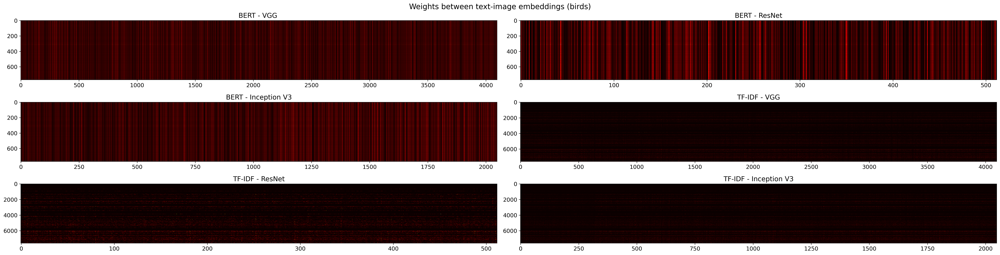

In [11]:
fig = plt.figure(dpi=300)
fig.suptitle("Weights between text-image embeddings (birds)", fontsize=16)
ax = plt.subplot(6, 2, 1)
ax.set_title("BERT - VGG ")
plt.imshow(
    np.abs(coefs["BERT - VGG (birds)"]),
    cmap="hot",
    interpolation="nearest",
    aspect="auto",
)
ax = plt.subplot(6, 2, 2)
ax.set_title("BERT - ResNet")
plt.imshow(
    np.abs(coefs.get("BERT - RESNET (birds)")),
    cmap="hot",
    interpolation="nearest",
    aspect="auto",
)
ax = plt.subplot(6, 2, 3)
ax.set_title("BERT - Inception V3")
plt.imshow(
    np.abs(coefs.get("BERT - INCEPTION (birds)")),
    cmap="hot",
    interpolation="nearest",
    aspect="auto",
)
ax = plt.subplot(6, 2, 4)
ax.set_title("TF-IDF - VGG")
plt.imshow(
    np.abs(coefs.get("TFIDF - VGG (birds)")),
    cmap="hot",
    interpolation="nearest",
    aspect="auto",
)
ax = plt.subplot(6, 2, 5)
ax.set_title("TF-IDF - ResNet")
plt.imshow(
    np.abs(coefs.get("TFIDF - RESNET (birds)")),
    cmap="hot",
    interpolation="nearest",
    aspect="auto",
)
ax = plt.subplot(6, 2, 6)
ax.set_title("TF-IDF - Inception V3")
plt.imshow(
    np.abs(coefs.get("TFIDF - INCEPTION (birds)")),
    cmap="hot",
    interpolation="nearest",
    aspect="auto",
)
fig.tight_layout()
plt.savefig(f"birds.png")
plt.show()